**EKSTRASI FITUR LBP**

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt


def get_pixel(img, center, x, y):
    new_value = 0
    try:
        if img[x][y] >= center:
            new_value = 1
    except:
        pass
    return new_value

In [ ]:
def lbp_calculated_pixel(img, x, y):
  '''
  Format :
  64 | 128 | 1
  ----------------
  32 | 0 | 2
  ----------------
  16 | 8 | 4
  '''
  center = img[x][y]
  val_ar = []
  val_ar.append(get_pixel(img, center, x-1, y+1)) # top_right
  val_ar.append(get_pixel(img, center, x, y+1)) # right
  val_ar.append(get_pixel(img, center, x+1, y+1)) # bottom_right
  val_ar.append(get_pixel(img, center, x+1, y)) # bottom
  val_ar.append(get_pixel(img, center, x+1, y-1)) # bottom_left
  val_ar.append(get_pixel(img, center, x, y-1)) # left
  val_ar.append(get_pixel(img, center, x-1, y-1)) # top_left

  val_ar.append(get_pixel(img, center, x-1, y)) # top
  power_val = [1, 2, 4, 8, 16, 32, 64, 128]
  val = 0
  for i in range(len(val_ar)):
    val += val_ar[i] * power_val[i]
  return val

menampilkan output

In [ ]:
def show_output(output_list):
    output_list_len = len(output_list)
    figure = plt.figure(figsize=(20, 6))
    for i in range(output_list_len):
        current_dict = output_list[i]
        current_img = current_dict["img"]
        current_xlabel = current_dict["xlabel"]
        current_ylabel = current_dict["ylabel"]
        current_xtick = current_dict["xtick"]
        current_ytick = current_dict["ytick"]
        current_title = current_dict["title"]
        current_type = current_dict["type"]
        current_plot = figure.add_subplot(1, output_list_len, i+1)
        if current_type == "gray":
            current_plot.imshow(current_img, cmap = plt.get_cmap('gray'))
            current_plot.set_title(current_title)
            current_plot.set_xticks(current_xtick)
            current_plot.set_yticks(current_ytick)
            current_plot.set_xlabel(current_xlabel)
            current_plot.set_ylabel(current_ylabel)
        elif current_type == "histogram":
            current_plot.plot(current_img, color = "black")
            current_plot.set_xlim([0,260])
            current_plot.set_title(current_title)
            current_plot.set_xlabel(current_xlabel)
            current_plot.set_ylabel(current_ylabel)
            ytick_list = [int(i) for i in current_plot.get_yticks()]
            current_plot.set_yticklabels(ytick_list,rotation = 90)
        elif current_type == "normal":
            current_plot.imshow(current_img)
            current_plot.set_title(current_title)
            current_plot.set_xticks(current_xtick)
            current_plot.set_yticks(current_ytick)
            current_plot.set_xlabel(current_xlabel)
            current_plot.set_ylabel(current_ylabel)

    plt.show()

fungsi main

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving dante.jpg to dante.jpg


<ipython-input-11-f70ba105bdac>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  current_plot.set_yticklabels(ytick_list,rotation = 90)


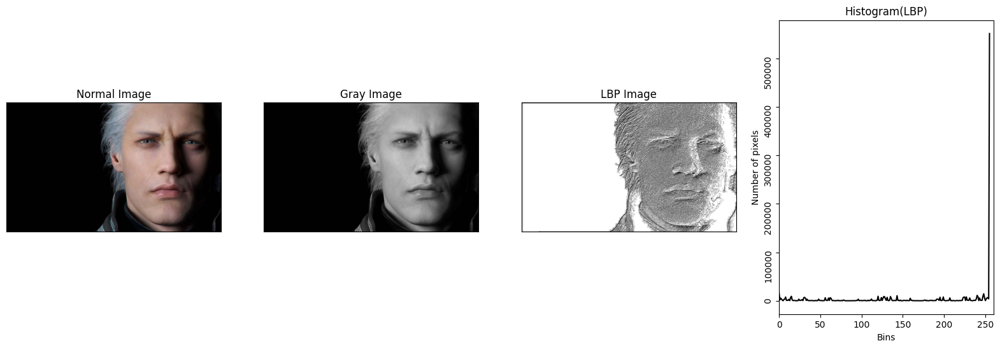

LBP Program selesai 


In [ ]:
image_file = 'vergil.jpg'
img_bgr = cv2.imread(image_file)
height, width, channel = img_bgr.shape
img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
img_lbp = np.zeros((height, width,3), np.uint8)
for i in range(0, height):
    for j in range(0, width):
        img_lbp[i, j] = lbp_calculated_pixel(img_gray, i, j)
hist_lbp = cv2.calcHist([img_lbp], [0], None, [256], [0, 256])
output_list = []
output_list.append({"img": cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB),

                    "xlabel": "",
                    "ylabel": "",
                    "xtick": [],
                    "ytick": [],
                    "title": "Normal Image",
                    "type": "normal"
                    })

output_list.append({"img": img_gray,
                    "xlabel": "",
                    "ylabel": "",
                    "xtick": [],
                    "ytick": [],
                    "title": "Gray Image",
                    "type": "gray"
                    })

output_list.append({"img": img_lbp,
                    "xlabel": "",
                    "ylabel": "",
                    "xtick": [],
                    "ytick": [],
                    "title": "LBP Image",
                    "type": "gray"
                    })

output_list.append({"img": hist_lbp,
                    "xlabel": "Bins",
                    "ylabel": "Number of pixels",
                    "xtick": None,
                    "ytick": None,
                    "title": "Histogram(LBP)",
                    "type": "histogram"
                    })
show_output(output_list)
cv2.waitKey(0)
cv2.destroyAllWindows()
print("LBP Program selesai ")

Brightness yang berbeda

<ipython-input-11-f70ba105bdac>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  current_plot.set_yticklabels(ytick_list,rotation = 90)


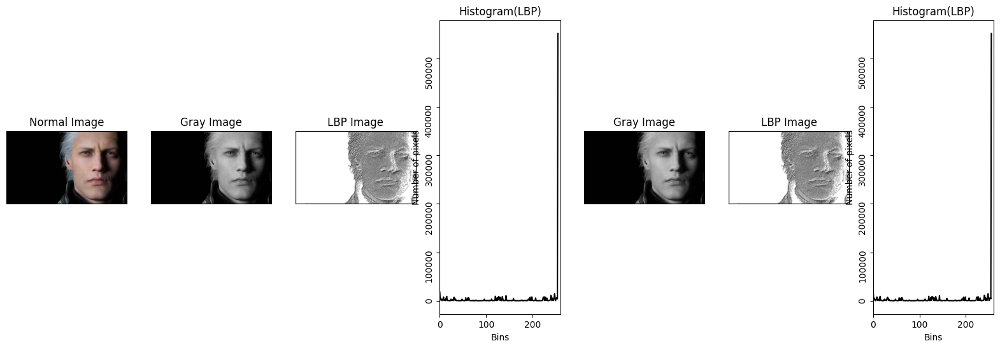

LBP Program selesai 


In [ ]:
def brighter(nilai, img):
    img_b = np.zeros((height, width,3), np.uint8)
    for y in range(0, height):
        for x in range(0, width):
            red = img[y][x][2] + nilai
            green = img[y][x][1] + nilai
            blue = img[y][x][0] + nilai
            if red > 255:
               red = 255
            if red < 0:
               red = 0
            if green > 255:
               green = 255
            if green < 0:
               green = 0
            if blue > 255:
               blue = 255
            if blue < 0:
               blue = 0
        img_b[y][x] = (red, green, blue)
    return img_b
image_file = 'vergil.jpg'
image_file2 = 'dante.jpg'
img_bgr = cv2.imread(image_file)
height, width, channel = img_bgr.shape
img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
img_gray2 = cv2.cvtColor(brighter(50, img_bgr), cv2.COLOR_BGR2GRAY)
img_bgr2 = cv2.imread(image_file2)
height2, width2, channel2 = img_bgr2.shape
img_gray3 = cv2.cvtColor(img_bgr2, cv2.COLOR_BGR2GRAY)

def lbp(img_gray, height, width, img_bgr):
    img_lbp = np.zeros((height, width,3), np.uint8)
    for i in range(0, height):
        for j in range(0, width):
            img_lbp[i, j] = lbp_calculated_pixel(img_gray, i, j)
    hist_lbp = cv2.calcHist([img_lbp], [0], None, [256], [0, 256])
    output_list = []
    output_list.append({"img": cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB),

                        "xlabel": "",
                        "ylabel": "",
                        "xtick": [],
                        "ytick": [],
                        "title": "Normal Image",
                        "type": "normal"
                        })

output_list.append({"img": img_gray,
                    "xlabel": "",
                    "ylabel": "",
                    "xtick": [],
                    "ytick": [],
                    "title": "Gray Image",
                    "type": "gray"
                    })

output_list.append({"img": img_lbp,
                    "xlabel": "",
                    "ylabel": "",
                    "xtick": [],
                    "ytick": [],
                    "title": "LBP Image",
                    "type": "gray"
                    })

output_list.append({"img": hist_lbp,
                    "xlabel": "Bins",
                    "ylabel": "Number of pixels",
                    "xtick": None,
                    "ytick": None,
                    "title": "Histogram(LBP)",
                    "type": "histogram"
                    })
show_output(output_list)

cv2.waitKey(0)
cv2.destroyAllWindows()
print("LBP Program selesai ")

lbp(img_gray, height, width, img_bgr)
lbp(img_gray2, height, width, img_bgr)
lbp(img_gray3, height2, width2, img_bgr2)

LATIHAN 2. EKSTRASI FITUR BERDASARKAN WARNA

In [1]:
import numpy as np
import imageio
import matplotlib.pyplot as plt
import cv2

In [2]:
from google.colab import files
uploaded = files.upload()

Saving greenfield.jpg to greenfield.jpg


In [3]:
img_bgr = cv2.imread("greenfield.jpg")
img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
height, width, channel = img_bgr.shape

Membuat variable untuk menyimpan data gambar

In [4]:
hgr = np.zeros((256))
hgg = np.zeros((256))
hgb = np.zeros((256))
hgrgb = np.zeros((768), dtype=np.int32)

Mengisi nilai dalam array hg dengan 0

In [6]:
def makeItZero():
    for x in range(0, 256):
        hgr[x] = 0
        hgg[x] = 0
        hgb[x] = 0
    for x in range(0, 768):
        hgrgb[x] = 0

Menghitung nilai dari gambar

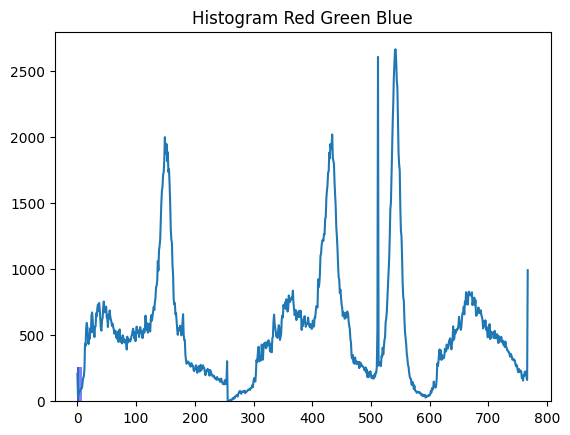

In [7]:
makeItZero()
# th = int(256/64)
temp = [0]
for y in range(0, height):
    for x in range(0, width):
        red = int(img[y][x][0])
        green = int(img[y][x][1])
        blue = int(img[y][x][2])
        red = red + 0
        green = green + 256
        blue = blue + 512
# temp.append(green)
        hgrgb[red] += 1
        hgrgb[green] += 1
        hgrgb[blue] += 1
binsrgb = np.linspace(0, 768, 100)

binsr = np.linspace(0, 0, 100)
plt.hist(hgr, binsr, color = "red", alpha=0.5)
binsg = np.linspace(0, 256, 100)
plt.hist(hgr, binsg, color = "green", alpha=0.5)
binsb = np.linspace(0, 768, 100)
plt.hist(hgr, binsb, color = "blue", alpha=0.5)
#plt.hist(hgr, binsrgb, alpha=0.5)
plt.plot(hgrgb)
plt.title("Histogram Red Green Blue")
plt.show()

Menggunakan OpenCV

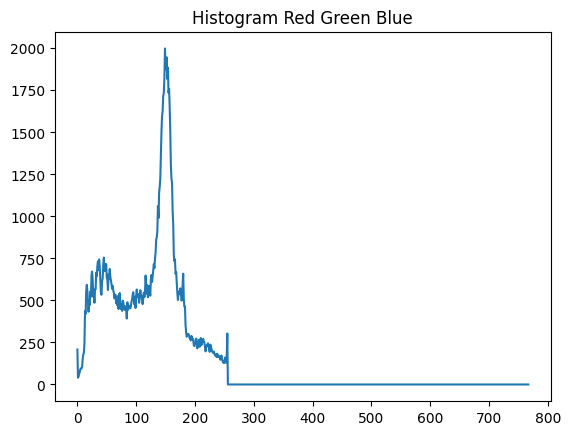

In [8]:
hist_img = cv2.calcHist([img], [0], None, [768], [0, 768])
plt.plot(hist_img)
plt.title("Histogram Red Green Blue")
plt.show()

Menampilkan histogram

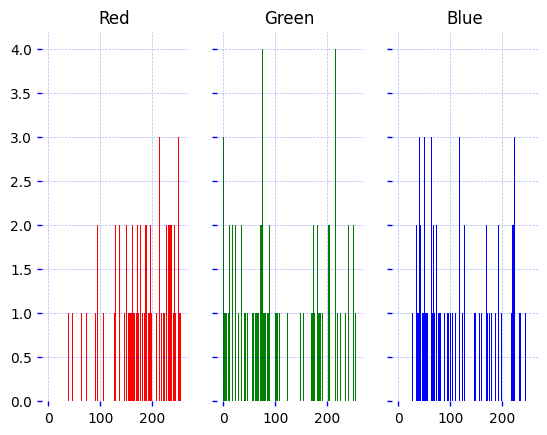

In [9]:
makeItZero()
for y in range(0, img.shape[0]):
    for x in range(0, img.shape[1]):
        red = img[y][x][0]
        green = img[y][x][1]
        blue = img[y][x][2]
        hgr[red] += 1
        hgg[green] += 1
        hgb[blue] += 1
def plot_result(red, green, blue):
    bins = np.linspace(0, 256, 128)

    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=True)

    for ax in [ax1, ax2, ax3]:
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
        ax.spines["left"].set_visible(False)
        ax.spines["bottom"].set_visible(False)
        ax.grid(color='b', linestyle='--', linewidth=0.5, alpha=0.3)
        ax.tick_params(direction='out', color='b', width='1')

    ax1.set_title('Red')
    ax2.set_title('Green')
    ax3.set_title('Blue')

    ax1.hist(red, bins, color="red", alpha=1)
    ax2.hist(green, bins, color="green", alpha=1)
    ax3.hist(blue, bins, color="blue", alpha=1)
    plt.rcParams['figure.figsize'] = [20, 7]

plot_result(hgr, hgg, hgb)

LATIHAN 3. EKSTRASI FITUR GLCM

In [18]:
from google.colab import files
uploaded = files.upload()

Saving greyfield.jpg to greyfield.jpg


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skim

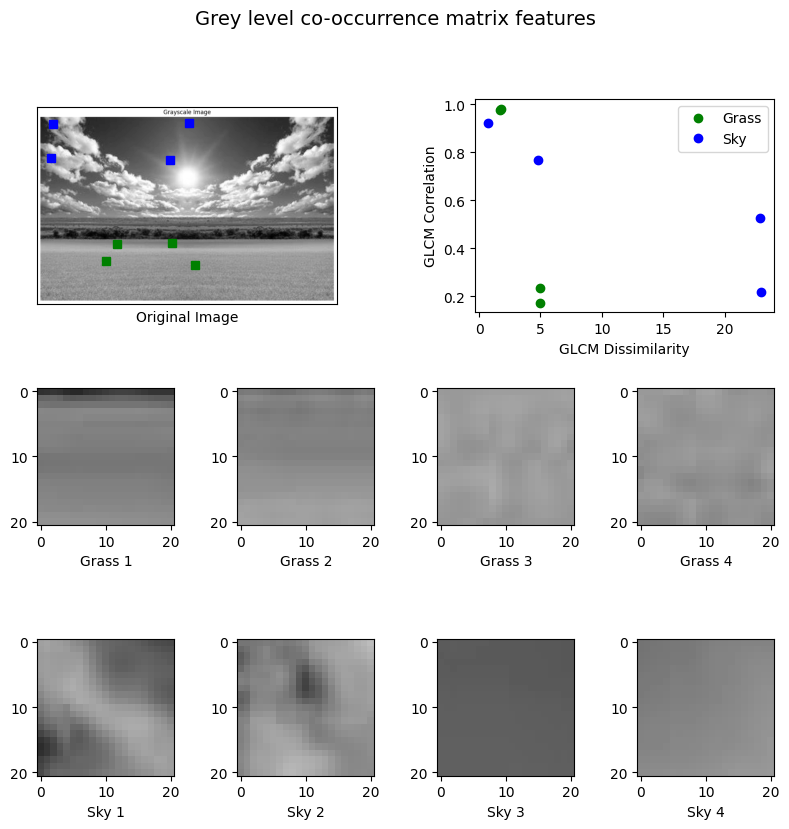

In [65]:
import matplotlib.pyplot as plt

from skimage.feature import greycomatrix, greycoprops
from skimage import data
PATCH_SIZE = 21

# load image
image = cv2.imread('greyfield.jpg', cv2.IMREAD_GRAYSCALE)

grass_locations = [(390, 385), (392, 223), (444, 192), (455, 455)]
grass_patches = []
for loc in grass_locations:
    grass_patches.append(image[loc[0]:loc[0] + PATCH_SIZE,
                               loc[1]:loc[1] + PATCH_SIZE])
sky_locations = [(38, 34), (139, 28), (37, 437), (145, 379)]
sky_patches = []
for loc in sky_locations:
    sky_patches.append(image[loc[0]:loc[0] + PATCH_SIZE,
                             loc[1]:loc[1] + PATCH_SIZE])

# menghitung GLCM
xs = []
ys = []
for patch in (grass_patches + sky_patches):
    glcm = greycomatrix(patch, distances=[5], angles=[0], levels=256,

                        symmetric=True, normed=True)
    xs.append(greycoprops(glcm, 'dissimilarity')[0, 0])
    ys.append(greycoprops(glcm, 'correlation')[0, 0])
fig = plt.figure(figsize=(8, 8))

# tampilkan original image dengan lokasi patches
ax = fig.add_subplot(3, 2, 1)
ax.imshow(image, cmap=plt.cm.gray,
          vmin=0, vmax=255)
for (y, x) in grass_locations:
    ax.plot(x + PATCH_SIZE / 2, y + PATCH_SIZE / 2, 'gs')
for (y, x) in sky_locations:
    ax.plot(x + PATCH_SIZE / 2, y + PATCH_SIZE / 2, 'bs')
ax.set_xlabel('Original Image')
ax.set_xticks([])
ax.set_yticks([])
ax.axis('image')
# plot (dissimilarity, correlation)
ax = fig.add_subplot(3, 2, 2)
ax.plot(xs[:len(grass_patches)], ys[:len(grass_patches)], 'go',
        label='Grass')
ax.plot(xs[len(grass_patches):], ys[len(grass_patches):], 'bo',
        label='Sky')
ax.set_xlabel('GLCM Dissimilarity')
ax.set_ylabel('GLCM Correlation')
ax.legend()

# display
for i, patch in enumerate(grass_patches):
      ax = fig.add_subplot(3, len(grass_patches), len(grass_patches)*1 + i + 1)
      ax.imshow(patch, cmap=plt.cm.gray,
                vmin=0, vmax=255)
      ax.set_xlabel('Grass %d' % (i + 1))
for i, patch in enumerate(sky_patches):
      ax = fig.add_subplot(3, len(sky_patches), len(sky_patches)*2 + i + 1)
      ax.imshow(patch, cmap=plt.cm.gray,
               vmin=0, vmax=255)
      ax.set_xlabel('Sky %d' % (i + 1))

# display
fig.suptitle('Grey level co-occurrence matrix features', fontsize=14, y=1.05)
plt.tight_layout()
plt.show()



**Latihan 4: Menggunakan Corner Detector**

In [33]:
from google.colab import files
uploaded = files.upload()

Saving cassual_head_updown.jpg to cassual_head_updown.jpg


metode Shi-Tomasi

jumlah titik terdeteksi =  319


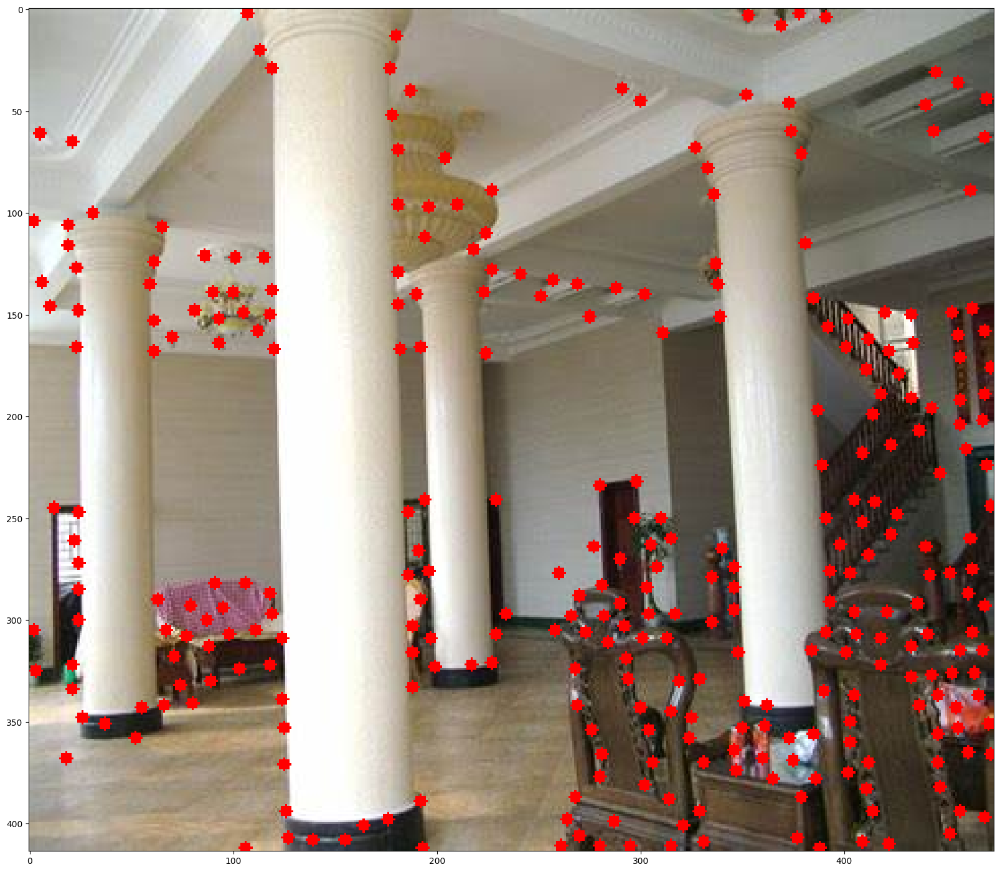

(<matplotlib.image.AxesImage at 0x7ff413632b00>, None)

In [29]:
# Menggunakan Shi-Tomasi GFTT untuk deteksi ujung (corner detection)
import numpy as np
import cv2
from matplotlib import pyplot as plt
# gunakan gambar
img = cv2.imread('house_pillars.jpg')
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

# deteksi pojok dengan GFTT
corners = cv2.goodFeaturesToTrack(gray,1000,0.01,10)
corners = np.int0(corners)
# menampilkan jumlah titik terdeteksi dengan fungsi numpy (np.ndarray.shape)
print("jumlah titik terdeteksi = ", corners.shape[0])
# untuk ditampilkan di Matplotlib, urutan band dibalik
rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
# perbesar ukuran hasil plotting
plt.rcParams["figure.figsize"] = (20,20)
# untuk tiap pojok yang terdeteksi, munculkan pada gambar
for i in corners:
  x,y = i.ravel()
  cv2.circle(rgb,(x,y),3,255,-1)
plt.imshow(rgb),plt.show()

metode Harris

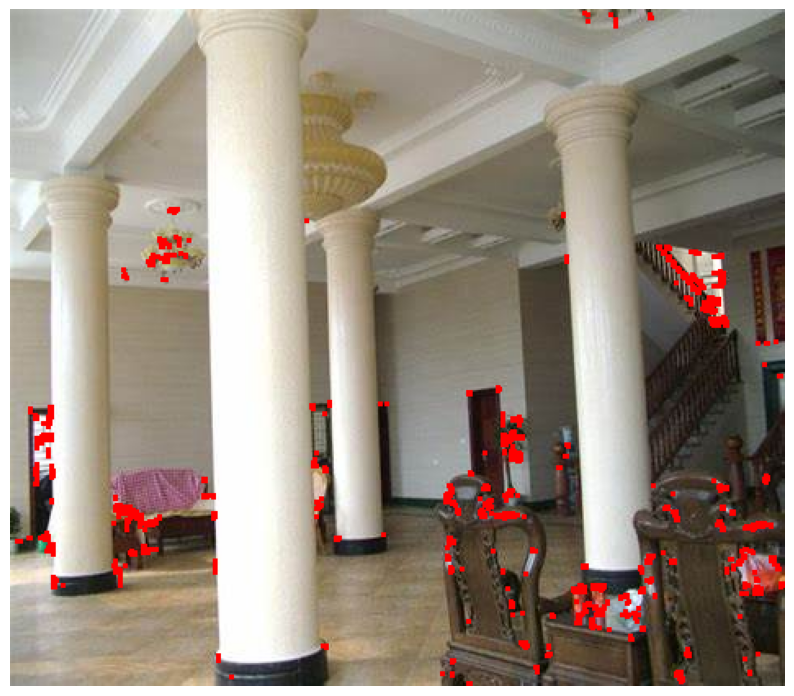

Number of detected corners: 4724


In [59]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

# Load image
img = cv2.imread('house_pillars.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Perform Harris corner detection
dst = cv2.cornerHarris(gray, 2, 3, 0.04)

# Threshold and dilate corner response
dst_threshold = 0.01 * dst.max()
corner_mask = dst > dst_threshold
corner_mask = np.uint8(corner_mask)
corner_mask = cv2.dilate(corner_mask, None)

# Display detected corners on the image
img_with_corners = img.copy()
img_with_corners[corner_mask != 0] = [0, 0, 255]

# Show the result
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(img_with_corners, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

# Count the number of detected corners
num_corners = np.sum(corner_mask)

# Display the number of detected corners
print("Number of detected corners:", num_corners)

**Latihan 5: Feature Detection and Matching**

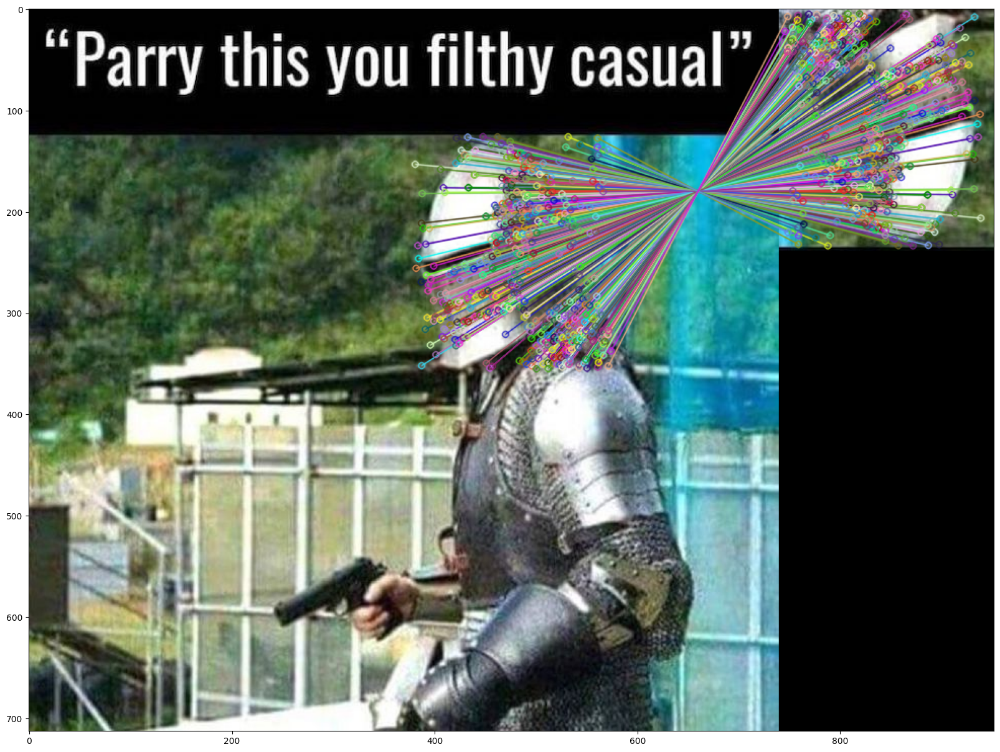

(<matplotlib.image.AxesImage at 0x7ff4164f2bf0>, None)

In [34]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

img1 = cv2.imread('Parry_This_You_Filthy_Casual.jpg') # gambar yang dituju
img2 = cv2.imread('cassual_head_updown.jpg') # gambar yang dicari
gray1= cv2.cvtColor(img1,cv2.COLOR_BGR2GRAY)
gray2= cv2.cvtColor(img2,cv2.COLOR_BGR2GRAY)
# Menggunakan Detector SIFT
sift = cv2.xfeatures2d.SIFT_create()
# Mencari Keypoint dengan SIFT
kp1, des1 = sift.detectAndCompute(gray1,None)
kp2, des2 = sift.detectAndCompute(gray2,None)
# Melakukan Matching dari hasil deteksi keypoints menggunakan
# BruteForce Matcher
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1,des2, k=2)
# Uji rasio matching sederhana
good = []
for m,n in matches:
  if m.distance < 0.5*n.distance:
      good.append([m])
img3 = None
# menggambar hasil match pada gambar baru (IMG3)
img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,img3,flags=2)
plt.imshow(cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)),plt.show()

**Latihan 6. template matching mendeteksi einsten pada gambar.**

In [36]:
from google.colab import files
uploaded = files.upload()

Saving s_t_a_r_s.jpg to s_t_a_r_s.jpg


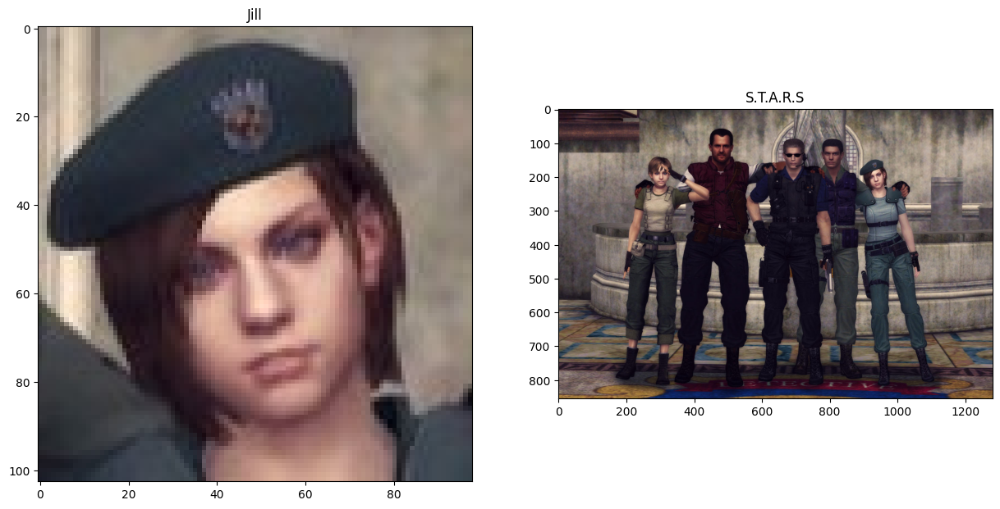

In [60]:
# tampilkan kedua gambar
from matplotlib import pyplot as plt
# panggil dan konversi warna agar sesuai dengan Matplotlib
jill = cv2.imread('jill.jpg')
jill = cv2.cvtColor(jill, cv2.COLOR_BGR2RGB) # simpan dengan nama yang sama = ditumpuk
# panggil dan konversi warna agar sesuai dengan Matplotlib
s_t_a_r_s = cv2.imread('s_t_a_r_s.jpg')
s_t_a_r_s = cv2.cvtColor(s_t_a_r_s, cv2.COLOR_BGR2RGB)
plt.subplot(121),plt.imshow(jill), plt.title('Jill')
plt.subplot(122),plt.imshow(s_t_a_r_s), plt.title('S.T.A.R.S')
plt.show()

hasil metode cv2.TM_CCOEFF : 


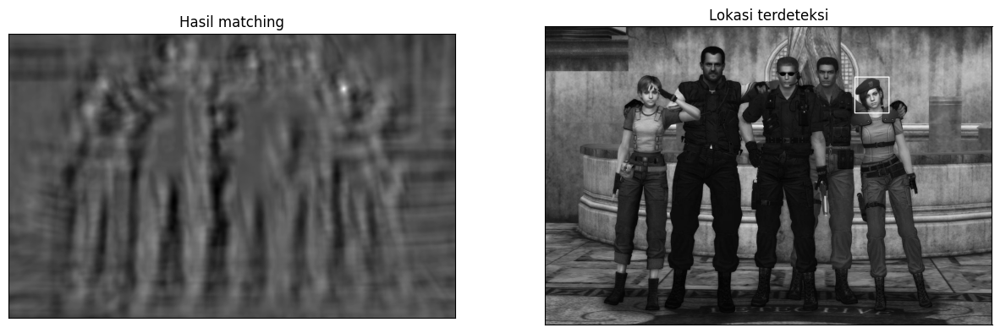

hasil metode cv2.TM_CCOEFF_NORMED : 


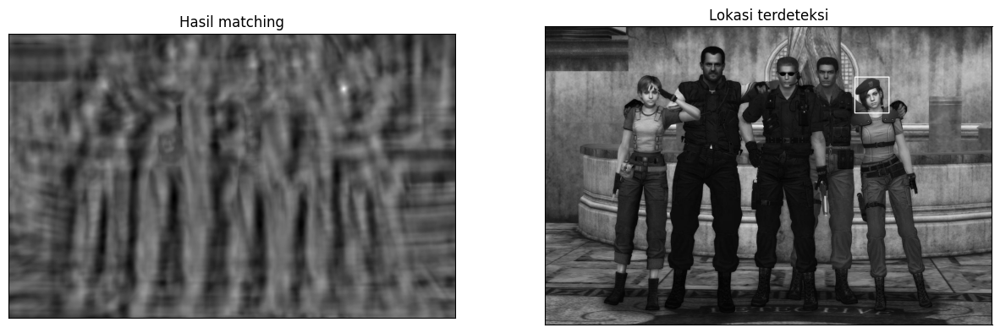

hasil metode cv2.TM_CCORR : 


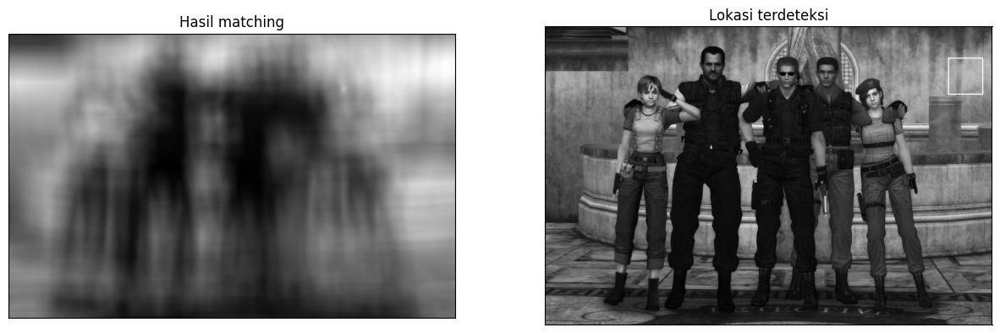

hasil metode cv2.TM_CCORR_NORMED : 


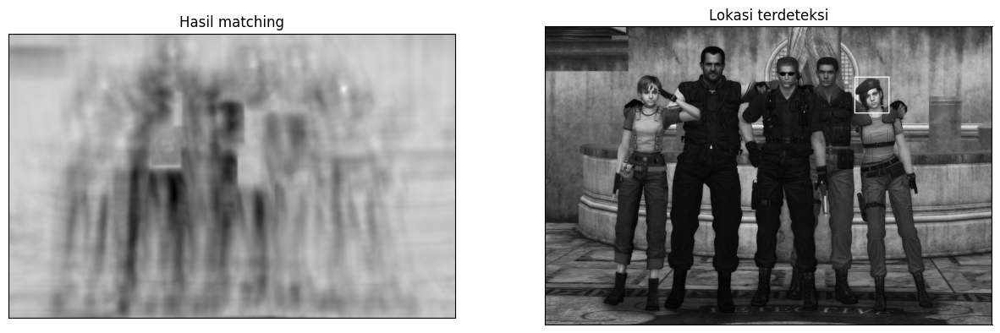

hasil metode cv2.TM_SQDIFF : 


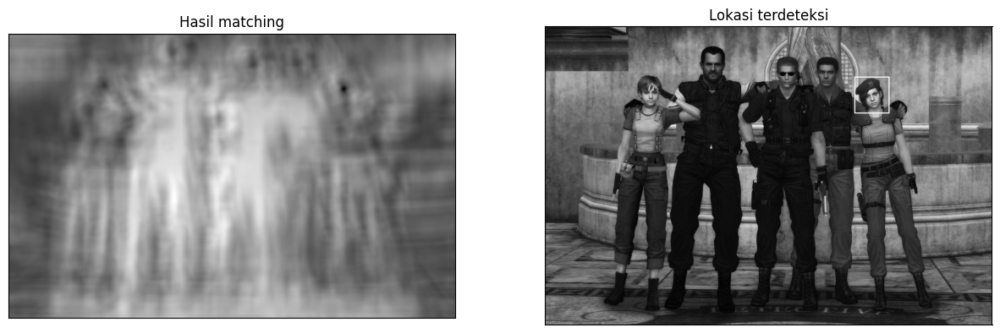

hasil metode cv2.TM_SQDIFF_NORMED : 


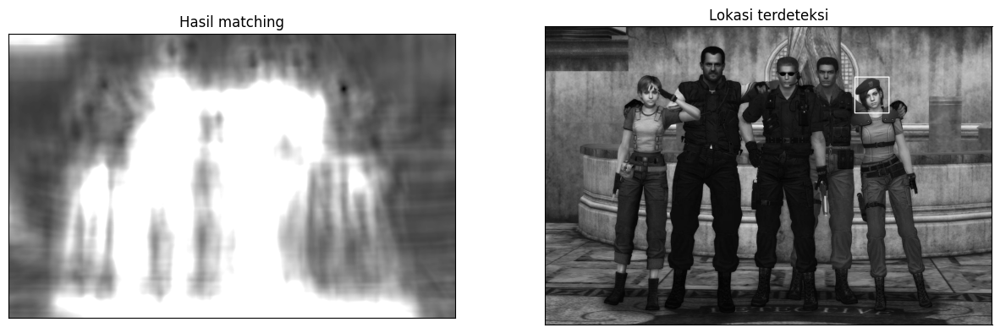

In [61]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
img = cv2.imread('s_t_a_r_s.jpg',0)
img2 = img.copy()
template = cv2.imread('jill.jpg',0)
w, h = template.shape[::-1]
# All the 6 methods for comparison in a list
methods = ['cv2.TM_CCOEFF', 'cv2.TM_CCOEFF_NORMED', 'cv2.TM_CCORR',
'cv2.TM_CCORR_NORMED', 'cv2.TM_SQDIFF', 'cv2.TM_SQDIFF_NORMED']

# perbesar ukuran hasil plotting
plt.rcParams["figure.figsize"] = (15,15)
for met in methods:
    img = img2.copy()
    method = eval(met)
    # menggunakan template matching
    res = cv2.matchTemplate(img,template,method)
    # mencari ukuran citra template untuk menggambar kotak
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
    # metode TM_SQDIFF dan TM_SQDIFF_NORMED menggunakan persamaan yang sedikit berbeda
    # sehingga dibuatkan fungsi khusus untuk mengambil nilai minimum
    if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)

# buat persegi pada lokasi yang ditemukan
    cv2.rectangle(img, top_left, bottom_right, 255, 2) # 2 adalah ketebalan garis kotak
    print("hasil metode", met, ": " )
    plt.subplot(121),plt.imshow(res,cmap = 'gray')
    plt.title('Hasil matching'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(img,cmap = 'gray')

    plt.title('Lokasi terdeteksi'), plt.xticks([]), plt.yticks([])

    plt.show()

**Latihan 7: Menghitung deteksi tulip dengan template matching**

In [56]:
from google.colab import files
uploaded = files.upload()

Saving Su_33.jpg to Su_33.jpg


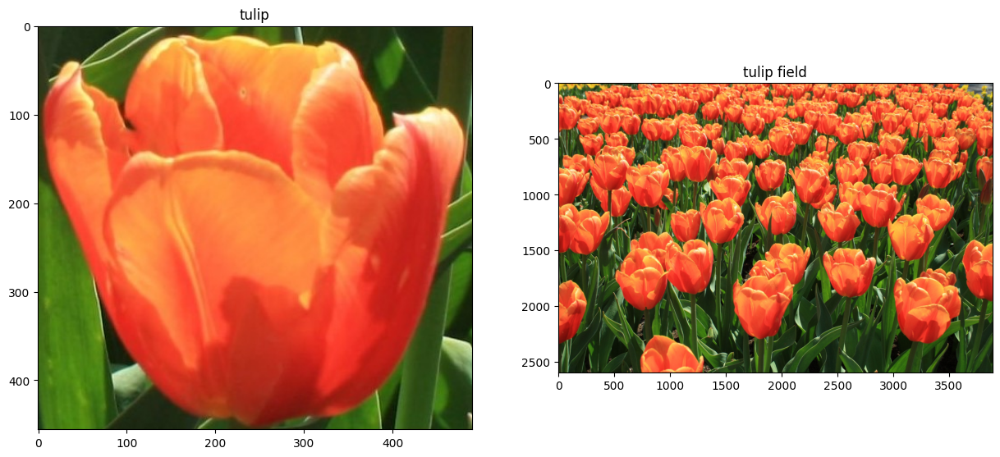

In [43]:
# menampilkan kedua gambar
from matplotlib import pyplot as plt
# memanggil dan konversi warna agar sesuai dengan Matplotlib
tulip = cv2.imread('tulip.jpg')
tulip = cv2.cvtColor(tulip, cv2.COLOR_BGR2RGB)
# panggil dan konversi warna agar sesuai dengan Matplotlib
tulip_field = cv2.imread('tulip_field.jpg')
tulip_field = cv2.cvtColor(tulip_field, cv2.COLOR_BGR2RGB)
plt.subplot(121),plt.imshow(tulip), plt.title('tulip')
plt.subplot(122),plt.imshow(tulip_field), plt.title('tulip field')
plt.show()

Jumlah objek ditemukan: 238


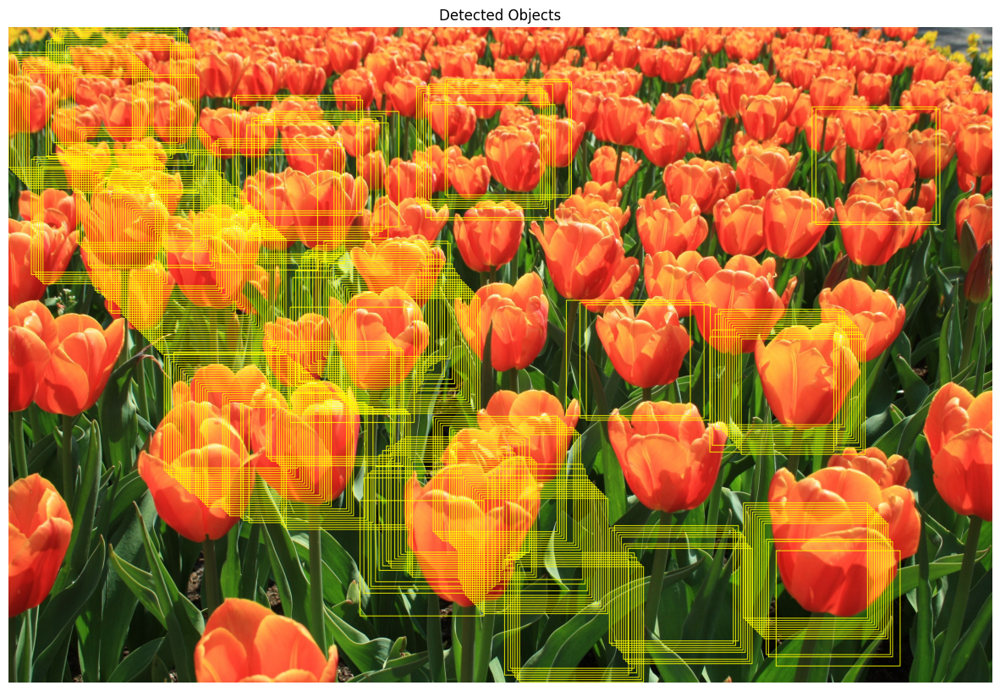

In [49]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img_rgb = cv2.imread('tulip_field.jpg')
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2GRAY)
template = cv2.imread('tulip.jpg', 0)
w, h = template.shape[::-1]

res = cv2.matchTemplate(img_gray, template, cv2.TM_CCOEFF_NORMED)
threshold = 0.15
loc = np.where(res >= threshold)

lspoint = []
lspoint2 = []
count = 0

for pt in zip(*loc[::-1]):
    if pt[0] not in lspoint and pt[1] not in lspoint2:
        cv2.rectangle(img_rgb, pt, (pt[0] + w, pt[1] + h), (0, 255, 255), 2)
        for i in range(pt[0] - 9, pt[0] + 9, 1):
            lspoint.append(i)
        for k in range(pt[1] - 9, pt[1] + 9, 1):
            lspoint2.append(k)
        count += 1
    else:
        continue

print("Jumlah objek ditemukan:", count)

# Tampilkan gambar hasil dengan matplotlib
plt.imshow(cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB))
plt.title('Detected Objects')
plt.axis('off')
plt.show()

Jumlah objek ditemukan  62


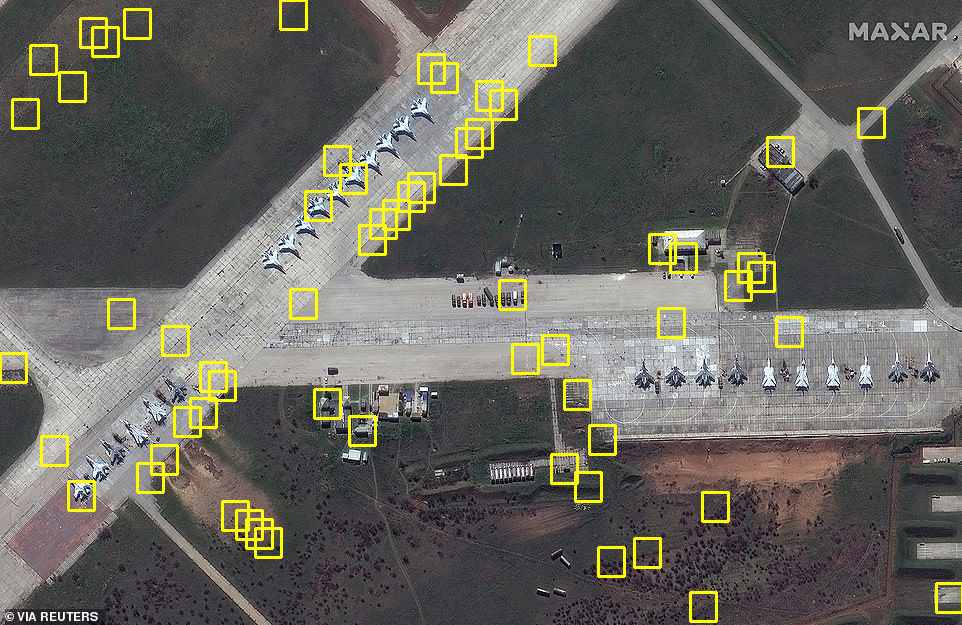

In [55]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
## membaca gambar utuh untuk dicari
img_rgb = cv2.imread('Su_jets.jpg')
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2GRAY)
## membaca template
template = cv2.imread('Su27.jpg',0)
## ukuran template. ukuran ini akan digunakan untuk menggambar kotak
w, h = template.shape[::-1]
# menggunakan metode COEFF-NORMALIZED
res = cv2.matchTemplate(img_gray,template,cv2.TM_CCOEFF_NORMED)
# Nilai threshold atau ambang batas deteksi kemiripan titik.
# Lakukan eksperimen dengan merubah nilai ini
threshold = 0.15
loc = np.where(res >= threshold)
## membuat array kosong untuk menyimpan lokasi-lokasi dari hasil deteksi
lspoint=[]
lspoint2=[]
count = 0 # untuk menyimpan jumlah matching yang ditemukan
for pt in zip(*loc[::-1]):
    ## jika sudah ada, skip lokasi tersebut
    if pt[0] not in lspoint and pt[1] not in lspoint2:
        ## gambar persegi warna kuning dengan ketebalan dua poin
        cv2.rectangle(img_rgb, pt, (pt[0] + w, pt[1] + h), (0,255,255), 2)
        for i in range(((pt[0])-9), ((pt[0])+9),1):
    ## tambahkan koordinat x ke list
            lspoint.append(i)
        for k in range(((pt[1])-9), ((pt[1])+9),1):
    ## tambahkan koordinat y ke list
            lspoint2.append(k)
        count+=1 ### berapa jumlah matching yang ditemukan?
    else:
        continue
print ("Jumlah objek ditemukan ", count)

## tampilkan dengan imshow
cv2_imshow(img_rgb)



Jumlah objek ditemukan  65


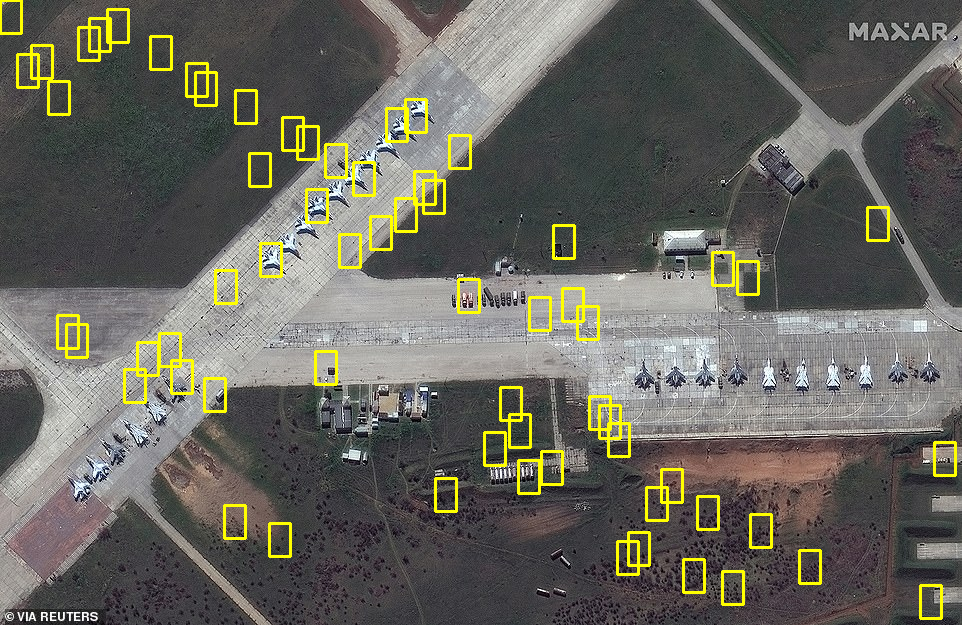

In [57]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
## membaca gambar utuh untuk dicari
img_rgb = cv2.imread('Su_jets.jpg')
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2GRAY)
## membaca template
template = cv2.imread('Su_33.jpg',0)
## ukuran template. ukuran ini akan digunakan untuk menggambar kotak
w, h = template.shape[::-1]
# menggunakan metode COEFF-NORMALIZED
res = cv2.matchTemplate(img_gray,template,cv2.TM_CCOEFF_NORMED)
# Nilai threshold atau ambang batas deteksi kemiripan titik.
# Lakukan eksperimen dengan merubah nilai ini
threshold = 0.15
loc = np.where(res >= threshold)
## membuat array kosong untuk menyimpan lokasi-lokasi dari hasil deteksi
lspoint=[]
lspoint2=[]
count = 0 # untuk menyimpan jumlah matching yang ditemukan
for pt in zip(*loc[::-1]):
    ## jika sudah ada, skip lokasi tersebut
    if pt[0] not in lspoint and pt[1] not in lspoint2:
        ## gambar persegi warna kuning dengan ketebalan dua poin
        cv2.rectangle(img_rgb, pt, (pt[0] + w, pt[1] + h), (0,255,255), 2)
        for i in range(((pt[0])-9), ((pt[0])+9),1):
    ## tambahkan koordinat x ke list
            lspoint.append(i)
        for k in range(((pt[1])-9), ((pt[1])+9),1):
    ## tambahkan koordinat y ke list
            lspoint2.append(k)
        count+=1 ### berapa jumlah matching yang ditemukan?
    else:
        continue
print ("Jumlah objek ditemukan ", count)

## tampilkan dengan imshow
cv2_imshow(img_rgb)

